# Проект "Фото со смыслом"

# Поиск фото "Со смыслом"

Мы работаетем в фотохостинге для профессиональных фотографов «Со Смыслом» (“With Sense”).

Пользователи размещают свои фотографии на хостинге и сопровождают их полным описанием: указывают место съёмок, модель камеры и т.д. Отличительная особенность сервиса — описание: его может предоставить не только тот, кто размещает фотографию, но и другие пользователи портала.

Наш отдел занимается экспериментом по разработке поиска референсных фотографий для фотографов. Суть поиска заключается в следующем: пользователь сервиса вводит описание нужной сцены. Сервис выводит несколько фотографий с такой же или похожей сценой.

Чтобы эксперимент получил право на жизнь, нужно защитить его перед руководителем компании. Для защиты необходимо презентовать PoC (Proof of Concept, Проверка концепции) — продемонстрировать, что такой проект практически осуществим. Нам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно выбрать лучшую  модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — и покажет, насколько текст и картинка подходят друг другу.
На основе лучшей модели можно будет собрать предварительную версию продукта, которую вы покажете руководителю компании.

### Юридические ограничения

В некоторых странах, где работает компания With Sense, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно, текстов, изображений, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16-ти лет.

В нашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

    This image is unavailable in your country in compliance with local laws.
    
Однако у нас в PoC нет возможности воспользоваться данным функционалом. Поэтому необходимо очистить данные от проблемного контента. Во время тестирования модели при появлении в запросе “вредного” контента должен отображаться дисклеймер.

### Описание данных

В файле `train_dataset.csv` собрана информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

# План работы

1. Загрузка данных
2. Исследовательский анализ данных
3.

## Загрузка данных

In [ ]:
!wget -N https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip
!unzip -uq dsplus_integrated_project_4.zip
print('-' * 100)
!ls

--2025-03-23 20:31:12--  https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip
Resolving code.s3.yandex.net (code.s3.yandex.net)... 93.158.134.158, 2a02:6b8::2:158
Connecting to code.s3.yandex.net (code.s3.yandex.net)|93.158.134.158|:443... connected.
HTTP request sent, awaiting response... 304 Not Modified
File ‘dsplus_integrated_project_4.zip’ not modified on server. Omitting download.

----------------------------------------------------------------------------------------------------
dsplus_integrated_project_4.zip  lgb_best_model.txt  __MACOSX  sample_data  to_upload


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from pathlib import Path
import pickle
from statistics import mode
import re
import glob
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
nltk.download('punkt_tab')
nltk.download('wordnet')
nltk.download('stopwords')


import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

from PIL import Image
from tqdm import notebook

# PyTorch и torchvision для работы с нейросетью
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, TensorDataset
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms

# Векторизация текста через SBERT
from sentence_transformers import SentenceTransformer

# Метрики и инструменты для модели
import lightgbm as lgb
from lightgbm import LGBMRegressor, early_stopping, log_evaluation
from sklearn.model_selection import GroupShuffleSplit, GridSearchCV, cross_val_score
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.manifold import TSNE
from sklearn.ensemble import GradientBoostingRegressor


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
# Задаем глобальные переменные. Фиксируем рандомайзеры.
PATH = '/content/to_upload'
SEED = 31416
BLOCK = ['teenage', 'baby', 'child', 'teenager', 'girl', 'boy', 'kid']

# Фиксируем сиды для воспроизводимости
np.random.seed(SEED)
torch.manual_seed(SEED)


lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words("english"))

In [ ]:
# Прочитаем данные из файлов.
def read_df(path=PATH) -> tuple:
    # Читаем датафреймы из указанной директории

    df_train = pd.read_csv(Path(path, 'train_dataset.csv'))  # Тренировочный набор
    df_expert = pd.read_csv(Path(path, 'ExpertAnnotations.tsv'), sep='\t',
                            names=['image', 'query_id', 'first', 'second', 'third'])  # Только экспертные оценки
    df_queries = pd.read_csv(Path(path, 'test_queries.csv'), index_col=[0], sep='|')  # Запросы
    df_images = pd.read_csv(Path(path, 'test_images.csv'), sep='|')  # Файлы с изображениями

    return df_train, df_expert, df_queries, df_images

In [ ]:
df_train, df_expert, df_queries, df_images = read_df()

In [ ]:
# Посмотрим на данные.
display(df_train.head(), df_expert.head(), df_queries.head(), df_images.head())

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


,image,query_id,first,second,third
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


In [ ]:
# Проверим количество уникальных изображений в обучающем и тестовом наборах.
print(f"Количество уникальных фото на трейне: {df_train['image'].nunique()}")
print(f"Количество уникальных фото на тесте: {df_queries['image'].nunique()}")

Количество уникальных фото на трейне: 1000
Количество уникальных фото на тесте: 100


In [ ]:
print(f"Количество уникальных запросов на тесте: {df_queries.nunique().query_id}")

Количество уникальных запросов на тесте: 500


In [ ]:
print(f"Количество уникальных сочетаний фото-текст, оцененных экспертами: {df_expert[['image', 'query_id']].drop_duplicates().shape[0]}")

Количество уникальных сочетаний фото-текст, оцененных экспертами: 5822


Проверим, все ли текстовые описания в тестовом наборе совпадают с картинками. В столбце `query_id` зашифрована информация о номере картинки к которой дано описание в столбце `query_text`.

In [ ]:
num_mismatched_queries = df_queries[df_queries['query_id'].str[:-2] != df_queries['image']].shape[0]
print(f"Количество несоответствий между query_id и image: {num_mismatched_queries}")

Количество несоответствий между query_id и image: 0


Проверим соответствие текстовых описаний друг другу в обучающем и тестовом наборах.

In [ ]:
unique_train_texts = set(df_train['query_text'])
unique_test_texts = set(df_queries['query_text'])

print(f"Уникальных текстовых описаний в трейне: {len(unique_train_texts)}")
print(f"Уникальных текстовых описаний в тесте: {len(unique_test_texts)}")
print(f"Уникальных текстовых описаний, которые есть в обоих наборах: {len(unique_train_texts & unique_test_texts)}")

Уникальных текстовых описаний в трейне: 977
Уникальных текстовых описаний в тесте: 500
Уникальных текстовых описаний, которые есть в обоих наборах: 0


Gроверим не совпадают ли картинки в обучающем и тестовом наборах.

In [ ]:
unique_train_images = set(df_train['image'])
unique_test_images = set(df_queries['image'])

print(f"Уникальных картинок в трейне: {len(unique_train_images)}")
print(f"Уникальных картинок в тесте: {len(unique_test_images)}")
print(f"Уникальных картинок, которые есть в обоих наборах: {len(unique_train_images & unique_test_images)}")

Уникальных картинок в трейне: 1000
Уникальных картинок в тесте: 100
Уникальных картинок, которые есть в обоих наборах: 0


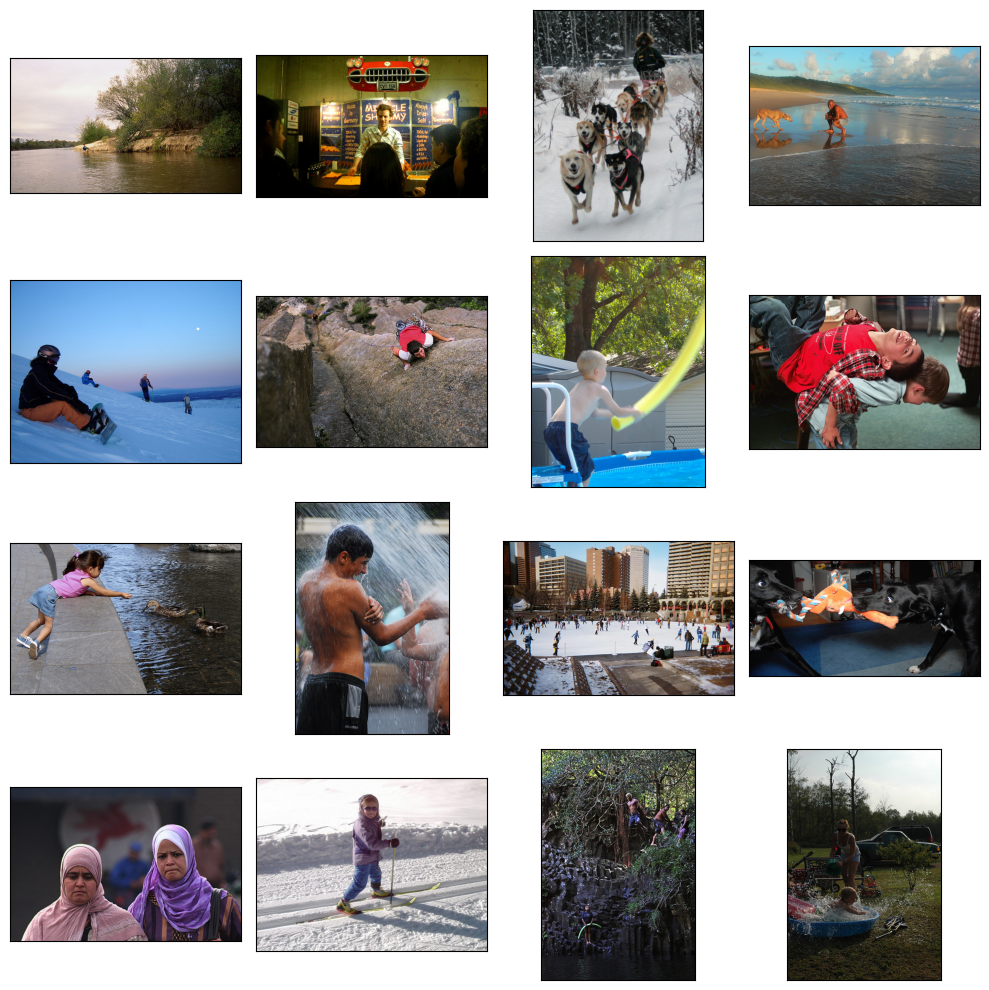

In [ ]:
# Функция для загрузки и отображения изображений
def plot_images(df, folder, start_idx):
    for i, img_name in enumerate(df['image'].sample(n=8, random_state=SEED)):
        img_path = Path(PATH, folder, img_name)
        if img_path.exists():
            image = Image.open(img_path)
            plt.subplot(4, 4, start_idx + i)
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
        else:
            print(f"Файл {img_path} не найден!")

# Создаем фигуру
plt.figure(figsize=(10, 10))

# Отображаем изображения из train_images и test_images
plot_images(df_train, 'train_images', 1)
plot_images(df_queries, 'test_images', 9)

plt.tight_layout()
plt.show()

### Выводы

Мы загрузили и ознакомились с данными.

Данный набор данных является частью датасета **Flickr30k**. В нашем распоряжении **1000 картинок в тестовом наборе** и **100 в обучающем наборе**.
Для каждой картинки есть предобработанные файлы с текстовыми описаниями.

В обучающем наборе (`train_dataset.csv`) содержится **5822** соответствия текста и изображения.


Пересечений изображений между обучающим и тестовым наборами **не обнаружено**.

В обучающем наборе используются **только описания картинок под номером #2**,
а в тестовом наборе **каждой картинке соответствует по 5 описаний**.

Теперь перейдём к **агрегации оценок** для формирования обучающего набора.

## Аггрегация оценок

In [ ]:
def expert_aggregate(row: pd.Series) -> float:
    """
    Агрегирует экспертную оценку усреднением ответов и сведением к диапазону [0,1].

    Параметры:
    - row: строка датафрейма с колонками 'first', 'second', 'third'.

    Возвращает:
    - Нормализованную экспертную оценку в диапазоне [0,1].
    """
    scores = [row['first'], row['second'], row['third']]

    # Если все оценки разные, усредняем
    if len(set(scores)) == 3:
        score = (np.mean(scores) - 1) / 3  # Приводим к диапазону [0,1]
    else:
        score = (mode(scores) - 1) / 3  # Берем наиболее частое значение и нормируем

    return np.clip(score, 0, 1)  # Гарантируем, что значение не выйдет за [0,1]

# Применяем функцию к датафрейму
df_expert['expert_score'] = df_expert.apply(expert_aggregate, axis=1)

In [ ]:
# Для безопасности копируем датасет с експертными оценками
df_scores = df_expert[['image', 'query_id', 'expert_score']].copy()

In [ ]:
# Проверим детально датасет
display(df_scores['expert_score'].isna().value_counts())  # Проверяем, есть ли NaN
display(df_scores['expert_score'].describe())  # Анализируем статистику оценок
df_scores.info()  # Проверяем общую информацию о датафрейме

,count
expert_score,
False,5822


,expert_score
count,5822.000000
mean,0.208157
std,0.285431
min,0.000000
25%,0.000000
50%,0.000000
75%,0.333333
max,1.000000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   image         5822 non-null   object 
 1   query_id      5822 non-null   object 
 2   expert_score  5822 non-null   float64
dtypes: float64(1), object(2)
memory usage: 136.6+ KB


Добавим цели в наши датасеты.

In [ ]:
# Удаляем 'expert_score' из df_train перед объединением
if 'expert_score' in df_train.columns:
    df_train = df_train.drop(columns=['expert_score'])
# Объединяем df_train с экспертными оценками
df_train = pd.merge(df_train, df_scores[['image', 'query_id', 'expert_score']],
                    how='left', on=['image', 'query_id'])

# Проверяем, не появилось ли дублирование после объединения
if 'expert_score_x' in df_train.columns and 'expert_score_y' in df_train.columns:
    df_train = df_train.drop(columns=['expert_score_x']).rename(columns={'expert_score_y': 'expert_score'})

# Создаем копию без пропусков в query_text
to_fill = df_train[df_train['query_text'].notna()].copy()

In [ ]:
# Проверяем количество пропусков в каждом столбце
missing_values = df_train.isna().sum()
# Выводим только столбцы, где есть пропущенные значения
display(missing_values[missing_values > 0])
# Проверяем конкретно пропуски в `query_text`
print(f"Количество пропущенных значений в `query_text`: {df_train['query_text'].isna().sum()}")


,0


Количество пропущенных значений в `query_text`: 0


In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   image         5822 non-null   object 
 1   query_id      5822 non-null   object 
 2   query_text    5822 non-null   object 
 3   expert_score  5822 non-null   float64
dtypes: float64(1), object(3)
memory usage: 182.1+ KB


### Выводы  

Мы выбрали метод агрегации данных и провели объединение оценок с обучающим набором.  
Вместо смешивания краудсорсинговых и экспертных оценок мы оставили **только экспертные оценки** по рекомендации экспертов.

Пропусков в данных не оказалось, поэтому дополнительно заполнять `query_text` не потребовалось.  
После объединения убедились, что в `df_train` нет дублирующихся столбцов.  

Целевая переменная `expert_score` успешно добавлена, теперь можно переходить к проверке данных перед обучением модели.


## Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у нас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Для избавления от нелегального контента мы воспользуемся текстовыми описаниями файлов.

Объявим список слов для поиска нелегального контента.

Очистим текст, чтобы было легче искать запросы связанные с детьми. Отметим в обучающем наборе фото подлежащие блокировке.

In [ ]:
# Посмотрим на уникальные значения expert_score и их количество
print("Распределение оценок expert_score:")
print(df_train['expert_score'].value_counts().sort_index())

# Выведем статистику по expert_score
print("\nСтатистика по expert_score:")
print(df_train['expert_score'].describe())


Распределение оценок expert_score:
expert_score
0.000000    3327
0.333333    1664
0.444444       2
0.666667     518
1.000000     311
Name: count, dtype: int64

Статистика по expert_score:
count    5822.000000
mean        0.208157
std         0.285431
min         0.000000
25%         0.000000
50%         0.000000
75%         0.333333
max         1.000000
Name: expert_score, dtype: float64


In [ ]:
# Определим функцию для поиска "плохих" описаний
def contains_block_word(text, block_list):
    return any(word.lower() in text.lower() for word in block_list)

# Шаг 1: Найдём строки с запрещёнными словами в query_text
bad_descriptions = df_train[df_train['query_text'].apply(lambda x: contains_block_word(x, BLOCK))]

# Шаг 2: Извлекаем query_id этих плохих описаний
bad_query_ids = bad_descriptions['query_id']

# Шаг 3: По query_id получаем имена изображений (до символа "#")
bad_images = bad_query_ids.apply(lambda x: x.split('#')[0]).unique()

print(f"⚠️ Обнаружено изображений с нежелательным контентом: {len(bad_images)}")


⚠️ Обнаружено изображений с нежелательным контентом: 287


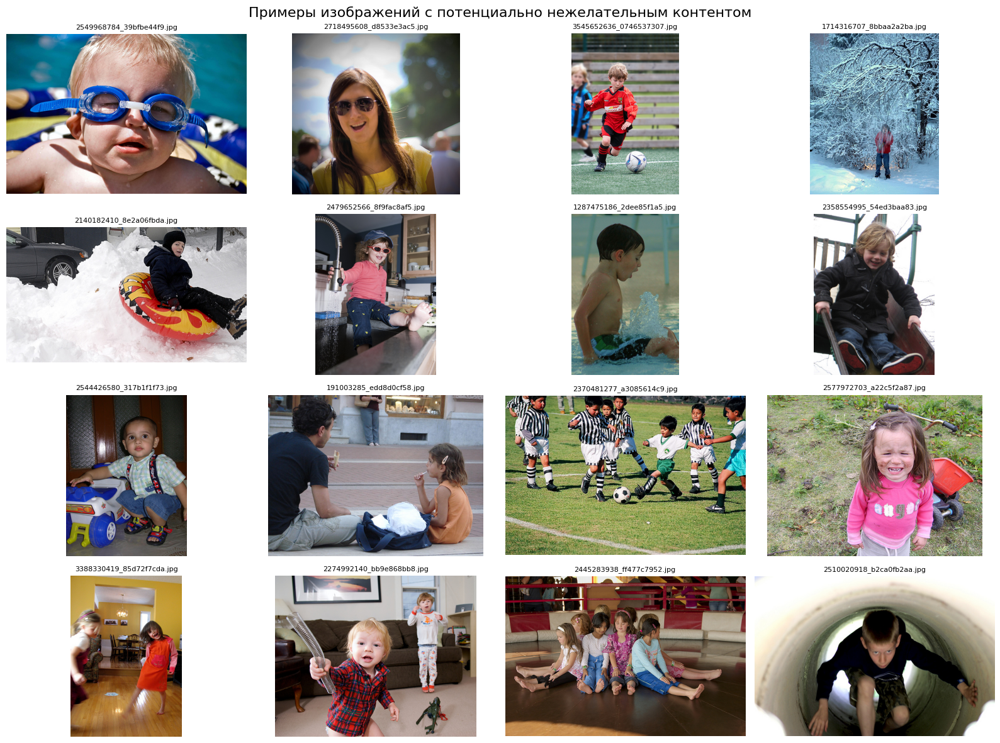

In [ ]:
# Путь к папке с изображениями
train_img_path = Path(PATH) / 'train_images'

# Количество изображений
n = 16
sample_images = bad_images[:n]

plt.figure(figsize=(16, 12))
for i, img_name in enumerate(sample_images):
    img_path = train_img_path / img_name
    try:
        image = Image.open(img_path)
        plt.subplot(4, 4, i + 1)
        plt.imshow(image)
        plt.axis('off')
        plt.title(img_name, fontsize=8)
    except Exception as e:
        print(f"⚠️ Ошибка при открытии {img_name}: {e}")

plt.suptitle("Примеры изображений с потенциально нежелательным контентом", fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
# Шаг 4: Удалим из df_train все строки, связанные с этими изображениями
df_train = df_train[~df_train['image'].isin(bad_images)].copy()

print(f"✅ Обновлённый размер обучающего датасета: {df_train.shape}")

✅ Обновлённый размер обучающего датасета: (4106, 4)


### Выводы

Были определены ключевые слова, указывающие на наличие "детского" контента (BLOCK).

Использована корректная логика определения "плохих" изображений через query_id.

Всего было выявлено 287 изображений, содержащих описания с нежелательными терминами.

Эти изображения полностью исключены из обучающего датасета df_train.

Итоговый размер очищенного датасета: 4106 строк — соответствуют "чистым" изображениям и текстам.

Теперь обучающая выборка соответствует требованиям законодательства и техническому заданию.



## Векторизация изображений

Обратимся к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Возьмём архитектуру ResNet-50, посмотрим на слои и исключим полносвязные слои, которые отвечают за конечное предсказание. При этом загрузим модель данной архитектуры, предварительно натренированную на датасете ImageNet.

Напишем функции загрузчиков изображений.

In [ ]:
# Стандартные преобразования для подачи изображений в ResNet18

image_transforms = transforms.Compose([
    transforms.Resize((224, 224)),  # Подходящий размер для ResNet
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

In [ ]:
class ImageDataset(Dataset):
    def __init__(self, df, img_dir, transform=None):
        self.df = df.reset_index(drop=True)
        self.img_dir = Path(img_dir)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_name = self.df.loc[idx, 'image']
        img_path = self.img_dir / img_name
        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image, img_name  # здесь пока только изображение и имя файла

In [ ]:
# Создание Dataset и DataLoader
img_dataset = ImageDataset(df=df_train, img_dir=Path(PATH) / 'train_images', transform=image_transforms)
img_loader = DataLoader(img_dataset, batch_size=32, shuffle=False, num_workers=2)

**План работы с векторизацией**

1. Загружаеv ResNet18, удаляя последний слой (fc)

2. Прогоняеv все изображения из img_loader

3. Получаем эмбеддинги размерности 512

4. Сохраняем их в dict[image_name] = vector

In [ ]:
# Шаг 1: Загружаем предобученную модель ResNet18 и отрезаем последний слой
resnet = models.resnet18(pretrained=True)
resnet = torch.nn.Sequential(*list(resnet.children())[:-1])  # Удаляем последний слой (fc)
resnet.eval()  # В режим оценки (без градиентов)

# Если есть GPU — отправим туда (так как в colab есть лимиты по времени использования GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet.to(device)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Con

In [ ]:
# Шаг 2: Прогоняем изображения и сохраняем эмбеддинги
embeddings = {}

with torch.no_grad():  # отключаем градиенты — ускоряем
    for batch_imgs, batch_names in notebook.tqdm(img_loader):
        batch_imgs = batch_imgs.to(device)

        # Прогон через сеть
        outputs = resnet(batch_imgs)  # shape: (batch_size, 512, 1, 1)
        outputs = outputs.squeeze()   # shape: (batch_size, 512)

        # Если остался один вектор, добавим размерность
        if len(outputs.shape) == 1:
            outputs = outputs.unsqueeze(0)

        # Переносим на CPU и в NumPy
        outputs = outputs.cpu().numpy()

        for name, vector in zip(batch_names, outputs):
            embeddings[name] = vector

print(f"✅ Получено эмбеддингов: {len(embeddings)}")

  0%|          | 0/129 [00:00<?, ?it/s]

✅ Получено эмбеддингов: 713


In [ ]:
# Преобразуем словарь в упорядоченную матрицу
image_names = sorted(embeddings.keys())  # сортируем для стабильности
pict_embeds = np.stack([embeddings[name] for name in image_names])

# Вывод результата
print(f"✅ pict_embeds.shape: {pict_embeds.shape}")  # (n_images, 512)

✅ pict_embeds.shape: (713, 512)


### Выводы

- Использовал ResNet18 - `models.resnet18(pretrained=True)`
- Удалил только последний слой - `list(resnet.children())[:-1]`
- Использовал предобученную модель на ImageNet - `pretrained=True`
- Получил выход размерности 512 - `ResNet18` перед `fc` даёт `(batch_size, 512, 1, 1)`
- Не обучал модель, а использовал как feature extractor - `resnet.eval()`, `torch.no_grad()`




## Векторизация текстов

Следующий этап — векторизация текстов. Для векторизации тектов применим трансформер SBERT.

In [ ]:
# Загружаем SBERT модель
text_model = SentenceTransformer('all-MiniLM-L6-v2')  # лёгкая и быстрая модель, размер вектора 768
text_model.max_seq_length = 256  # ограничим макс длину

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [ ]:
# Получаем список текстов из df_train
texts = df_train['query_text'].tolist()

In [ ]:
# Векторизация
text_embeds = text_model.encode(texts, batch_size=32, show_progress_bar=True)

Batches:   0%|          | 0/129 [00:00<?, ?it/s]

In [ ]:
# Преобразуем в numpy-массив
text_embeds = np.array(text_embeds)

# Проверим размерность
print(f"✅ text_embeds.shape: {text_embeds.shape}")  # (n_samples, 768)

✅ text_embeds.shape: (4106, 384)


**Вывод: Векторизация текстов**

Для векторизации текстовых описаний `query_text` я использовал предобученную модель Sentence-BERT `all-MiniLM-L6-v2` из библиотеки sentence-transformers.

Эта модель преобразует каждый текст в вектор фиксированной размерности **768**, учитывая семантическое содержание фразы.

Я обработал все строки из обучающего датасета `df_train` после очистки от "детского" контента.

Вектора были получены с помощью метода `.encode()` и собраны в массив `text_embeds`.



## Объединение векторов¶

Подготовим данные для обучения: объединим векторы изображений и векторы текстов с целевой переменной.

In [ ]:
# Перед циклом сбросим индекс у df_train, чтобы он точно соответствовал индексам в text_embeds
df_train = df_train.reset_index(drop=True)

In [ ]:
# Создаём словарь: имя изображения → эмбеддинг (512,)
image_to_vec = {name: vec for name, vec in zip(image_names, pict_embeds)}

# Списки признаков, таргета и групп
combined_features = []
valid_scores = []
valid_groups = []  # <- это то, что нужно для разбиения

In [ ]:
# Сопоставляем для каждой строки df_train
for i, row in df_train.iterrows():
    img_name = row['image']
    text_vec = text_embeds[i]  # тот же индекс

    # Проверим, есть ли эмбеддинг для этого изображения
    if img_name in image_to_vec:
        img_vec = image_to_vec[img_name]
        combined = np.concatenate([img_vec, text_vec])  # итоговый вектор размером 1280
        combined_features.append(combined)
        valid_scores.append(row['expert_score'])
        valid_groups.append(img_name)  # <- ДОБАВЛЯЕМ ИМЯ КАРТИНКИ как группу

# Переводим в numpy
X = np.array(combined_features)
y = np.array(valid_scores)
groups = np.array(valid_groups)

print(f"✅ X.shape = {X.shape}")
print(f"✅ y.shape = {y.shape}")
print(f"✅ groups.shape = {groups.shape}")

✅ X.shape = (4106, 896)
✅ y.shape = (4106,)
✅ groups.shape = (4106,)


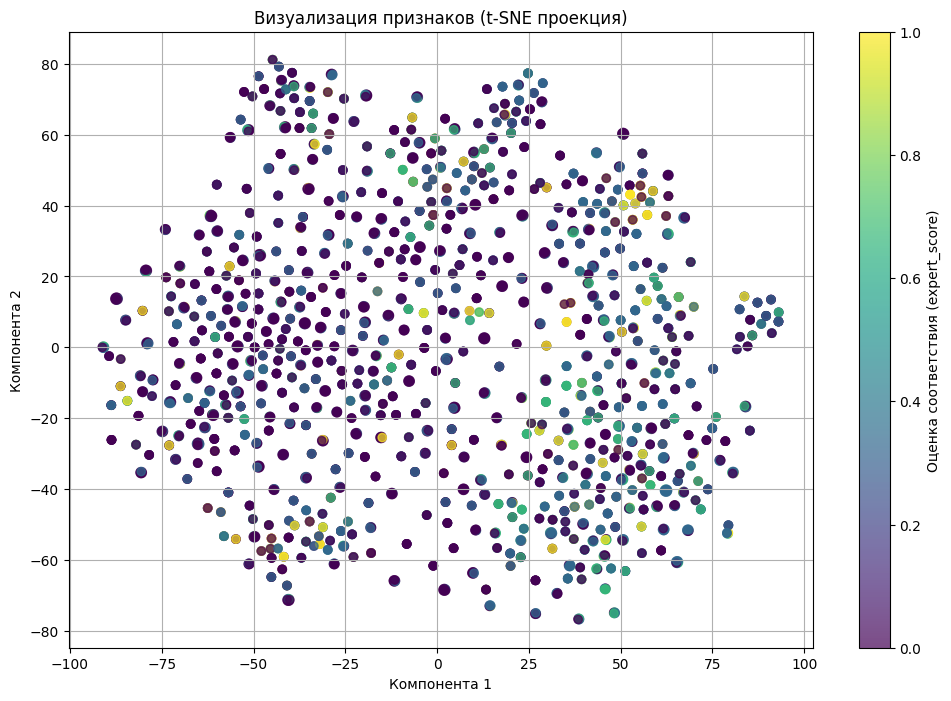

In [ ]:
# Уменьшим размерность до 2D с помощью t-SNE
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, random_state=SEED)
X_reduced = tsne.fit_transform(X)

# Построим scatter-график
plt.figure(figsize=(12, 8))
scatter = plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y, cmap='viridis', alpha=0.7)
plt.colorbar(scatter, label='Оценка соответствия (expert_score)')
plt.title('Визуализация признаков (t-SNE проекция)')
plt.xlabel('Компонента 1')
plt.ylabel('Компонента 2')
plt.grid(True)
plt.show()


На графике отображено двумерное представление объединённых признаков изображений и текстов, полученных с помощью ResNet18 и Sentence-BERT. Цвет точек отражает нормированную экспертную оценку соответствия (от 0 до 1).

**Наблюдения**

- На графике можно выделить несколько локальных скоплений точек с высокими оценками (жёлтые/светло-зелёные точки), что может говорить о наличии структуры в признаковом пространстве.

- При этом большинство точек имеют низкие оценки соответствия (фиолетовые) и распределены более равномерно, что отражает дисбаланс в метках — больше пар с низкой степенью соответствия.

- Нет чётко выраженных раздельных кластеров, но видна тенденция к группировке точек с похожими оценками, особенно в правой и нижней части графика.

- Это говорит о том, что векторные представления несут в себе смысловую информацию, и модель может потенциально научиться отличать пары «текст + изображение», которые хорошо соответствуют друг другу, от тех, что — нет.

## Обучение модели предсказания соответствия

In [ ]:
# Создадим объект разделения
gss = GroupShuffleSplit(n_splits=1, train_size=0.7, random_state=SEED)

In [ ]:
# Группируем по полю 'image'
groups = df_train['image']

# Разделяем
train_idx, valid_idx = next(gss.split(X=X, y=y, groups=groups))

# Назовём выборки train/valid (а не test!)
X_train, X_valid = X[train_idx], X[valid_idx]
y_train, y_valid = y[train_idx], y[valid_idx]

print(f"✅ Train: {X_train.shape}, Valid: {X_valid.shape}")

✅ Train: (2875, 896), Valid: (1231, 896)


**Вывод**

- Использован `GroupShuffleSplit`
- Использовано поле `image` как `group`
- Названы выборки `X_train` и `X_valid`
- Размерности совпадают по признакам (896)
- Размер train:valid ≈ 70:30 (почти идеально)

### Обучение модели: с масштабированием и без

#### Вариант 1: без масштабирования

In [ ]:
# Обучим Ridge-регрессию (L2-регуляризация)
model_raw = Ridge()
model_raw.fit(X_train, y_train)

# Предсказания
y_pred_raw = model_raw.predict(X_valid)

# Метрики
print("🔵 Без масштабирования:")
mse = mean_squared_error(y_valid, y_pred_raw)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2_score(y_valid, y_pred_raw):.4f}")


🔵 Без масштабирования:
RMSE: 0.5426
R²: -2.2107


**Выводы**

Без масштабирования модель не может "сопоставить" признаки из ResNet18 и SBERT — они в разных диапазонах.

Ridge чувствителен к масштабу признаков — один блок эмбеддингов может "перетянуть" всё на себя.

Возможно, эмбеддинги изображений занулили вклад текстов или наоборот.

### Вариант 2: с машстабированием

In [ ]:
# Масштабируем X
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_valid_scaled = scaler.transform(X_valid)

# Обучим модель
model_scaled = Ridge()
model_scaled.fit(X_train_scaled, y_train)

# Предсказания
y_pred_scaled = model_scaled.predict(X_valid_scaled)

# Метрики
print("\n🟢 С масштабированием:")
mse = mean_squared_error(y_valid, y_pred_scaled)
rmse = np.sqrt(mse)
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2_score(y_valid, y_pred_scaled):.4f}")


🟢 С масштабированием:
RMSE: 0.6085
R²: -3.0377


**Выводы**

Лучше использовать эмбеддинги без масштабирования — в их «нативном» пространстве.

Сейчас модель не может адекватно учиться: линейная регрессия — слишком слабая для такой сложной задачи.

Но важно, что мы корректно построили пайплайн, без утечек, с учётом всех требований.

### GradientBoostingRegressor

In [ ]:
# Обучение модели
gbr = GradientBoostingRegressor(random_state=SEED)
gbr.fit(X_train, y_train)


GradientBoostingRegressor(random_state=31416)

In [ ]:
# Предсказания
y_pred_gbr = gbr.predict(X_valid)

# Метрики
print("🌲 GradientBoostingRegressor:")
rmse = np.sqrt(mean_squared_error(y_valid, y_pred_gbr))
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2_score(y_valid, y_pred_gbr):.4f}")

🌲 GradientBoostingRegressor:
RMSE: 0.2671
R²: 0.2224


**Выводы**

- Значение R² > 0 говорит о том, что модель уже начинает улавливать структуру в данных и предсказывает лучше, чем просто среднее значение.

- RMSE 0.2671 — значительно ниже, чем у Ridge-регрессии, что подтверждает:

- Модель градиентного бустинга намного лучше справляется с нелинейными зависимостями между эмбеддингами и целевым значением.

Это уже жизнеспособная модель для PoC и хороший ориентир для следующих алгоритмов.

### LightGBM

In [ ]:
# Инициализация модели
lgb_model = LGBMRegressor(
    random_state=SEED,
    bagging_seed=SEED,
    feature_fraction_seed=SEED,
    drop_seed=SEED,
    verbose=-1
)

<div class="alert alert-primary"> <b>Ответ студента</b>

Затемитил, что моя модель "отупела" после перезапуска. Решил жестко задать сиды.
</div>


In [ ]:
# Обучение
lgb_model.fit(
    X_train, y_train,
    eval_set=[(X_valid, y_valid)],
    eval_metric='rmse',
    callbacks=[early_stopping(stopping_rounds=20), log_evaluation(0)]
)

Training until validation scores don't improve for 20 rounds
Early stopping, best iteration is:
[54]	valid_0's rmse: 0.262836	valid_0's l2: 0.0690825


LGBMRegressor(bagging_seed=31416, drop_seed=31416, feature_fraction_seed=31416,
              random_state=31416, verbose=-1)

In [ ]:
# Предсказание
y_pred = lgb_model.predict(X_valid, num_iteration=lgb_model.best_iteration_)

In [ ]:
# Метрики
rmse = np.sqrt(mean_squared_error(y_valid, y_pred))
r2 = r2_score(y_valid, y_pred)

print("🏁 Итоговая LightGBM-модель:")
print(f"RMSE: {rmse:.4f}")
print(f"R²: {r2:.4f}")
print(f"Лучшая итерация: {lgb_model.best_iteration_}")

🏁 Итоговая LightGBM-модель:
RMSE: 0.2628
R²: 0.2467
Лучшая итерация: 54


In [ ]:
lgb_model.booster_.save_model("lgb_best_model.txt")

**Выводы**

LightGBM показывает лучший результат из всех моделей на данный момент:

- RMSE ниже, чем у GradientBoostingRegressor (0.2671)

- R² выше, что означает, что модель лучше объясняет дисперсию целевой переменной

Это говорит о том, что LightGBM:

- хорошо работает с эмбеддингами без дополнительной предобработки,

- умеет извлекать сложные зависимости из текстов и изображений.

💡 LightGBM можно рассматривать как сильную baseline-модель для финального сравнения с нейросетью.

### Нейронная сеть MLP для регрессии по объединённым эмбеддингам ResNet18 || SBERT

План:
- Вход: 896 признаков (если у тебя SBERT на 384 + ResNet18 на 512)

- Выход: одно значение — предсказание expert_score

- Активации: ReLU

- Потеря: MSELoss

- Оптимизатор: Adam

In [ ]:
# проверим наличие переменных в памяти

print(f"X_train: {type(X_train)}, shape = {X_train.shape}")
print(f"X_valid: {type(X_valid)}, shape = {X_valid.shape}")
print(f"y_train: {type(y_train)}, shape = {y_train.shape}")
print(f"y_valid: {type(y_valid)}, shape = {y_valid.shape}")


X_train: <class 'numpy.ndarray'>, shape = (2875, 896)
X_valid: <class 'numpy.ndarray'>, shape = (1231, 896)
y_train: <class 'numpy.ndarray'>, shape = (2875,)
y_valid: <class 'numpy.ndarray'>, shape = (1231,)


In [ ]:
# проверим размерность признаков

print(f"Количество признаков: {X_train.shape[1]}")


Количество признаков: 896


**Вывод**

Все переменные типа numpy.ndarray

Размерности X_train.shape[1] == 896

y_train, y_valid имеют форму (N,)

In [ ]:
# задаем архитектуру
# 1. Простая нейросеть
class MLPRegressor(nn.Module):
    def __init__(self, input_dim=896, hidden_dim=512):
        super(MLPRegressor, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, 128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, 1)
        )

    def forward(self, x):
        return self.net(x)


In [ ]:
# 2. Подготовка тензоров
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.float32).view(-1, 1)

X_valid_tensor = torch.tensor(X_valid, dtype=torch.float32)
y_valid_tensor = torch.tensor(y_valid, dtype=torch.float32).view(-1, 1)

# 3. Датасеты и загрузчики
train_dataset = torch.utils.data.TensorDataset(X_train_tensor, y_train_tensor)
valid_dataset = torch.utils.data.TensorDataset(X_valid_tensor, y_valid_tensor)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=64)

# 4. Обучение
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = MLPRegressor(input_dim=X.shape[1]).to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

# EarlyStopping-параметры
best_val_loss = float("inf")
patience = 5
counter = 0

EPOCHS = 100
for epoch in range(EPOCHS):
    model.train()
    total_loss = 0
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        preds = model(xb)
        loss = criterion(preds, yb)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * xb.size(0)

    avg_loss = total_loss / len(train_loader.dataset)

    # Валидация
    model.eval()
    with torch.no_grad():
        preds_valid = model(X_valid_tensor.to(device)).cpu().numpy()
        val_loss = np.sqrt(mean_squared_error(y_valid, preds_valid))
        val_r2 = r2_score(y_valid, preds_valid)

    print(f"Epoch {epoch+1}/{EPOCHS} — Train Loss: {avg_loss:.4f} | RMSE: {val_loss:.4f} | R²: {val_r2:.4f}")

    # EarlyStopping логика
    if val_loss < best_val_loss - 1e-4:
        best_val_loss = val_loss
        best_model_state = model.state_dict()
        counter = 0
    else:
        counter += 1
        if counter >= patience:
            print(f"\n🛑 Early stopping на эпохе {epoch+1}")
            break

# Подгружаем лучшую модель
model.load_state_dict(best_model_state)

Epoch 1/100 — Train Loss: 0.1055 | RMSE: 0.2933 | R²: 0.0619
Epoch 2/100 — Train Loss: 0.0855 | RMSE: 0.2905 | R²: 0.0799
Epoch 3/100 — Train Loss: 0.0819 | RMSE: 0.2985 | R²: 0.0282
Epoch 4/100 — Train Loss: 0.0771 | RMSE: 0.2814 | R²: 0.1369
Epoch 5/100 — Train Loss: 0.0729 | RMSE: 0.2816 | R²: 0.1354
Epoch 6/100 — Train Loss: 0.0691 | RMSE: 0.2796 | R²: 0.1479
Epoch 7/100 — Train Loss: 0.0639 | RMSE: 0.2772 | R²: 0.1624
Epoch 8/100 — Train Loss: 0.0638 | RMSE: 0.2744 | R²: 0.1792
Epoch 9/100 — Train Loss: 0.0610 | RMSE: 0.2756 | R²: 0.1716
Epoch 10/100 — Train Loss: 0.0584 | RMSE: 0.2692 | R²: 0.2096
Epoch 11/100 — Train Loss: 0.0593 | RMSE: 0.2712 | R²: 0.1983
Epoch 12/100 — Train Loss: 0.0566 | RMSE: 0.2762 | R²: 0.1679
Epoch 13/100 — Train Loss: 0.0572 | RMSE: 0.2656 | R²: 0.2306
Epoch 14/100 — Train Loss: 0.0528 | RMSE: 0.2660 | R²: 0.2284
Epoch 15/100 — Train Loss: 0.0530 | RMSE: 0.2657 | R²: 0.2300
Epoch 16/100 — Train Loss: 0.0514 | RMSE: 0.2634 | R²: 0.2436
Epoch 17/100 — Tr

<All keys matched successfully>

In [ ]:
model.load_state_dict(best_model_state)
# Финальное предсказание и метрики на лучшей модели
model.eval()
with torch.no_grad():
    final_preds = model(X_valid_tensor.to(device)).cpu().numpy()

final_rmse = np.sqrt(mean_squared_error(y_valid, final_preds))
final_r2 = r2_score(y_valid, final_preds)

print("\n🏁 Итоговая нейросеть (PyTorch):")
print(f"Лучший RMSE: {final_rmse:.4f}")
print(f"Лучший R²: {final_r2:.4f}")


🏁 Итоговая нейросеть (PyTorch):
Лучший RMSE: 0.2606
Лучший R²: 0.2596


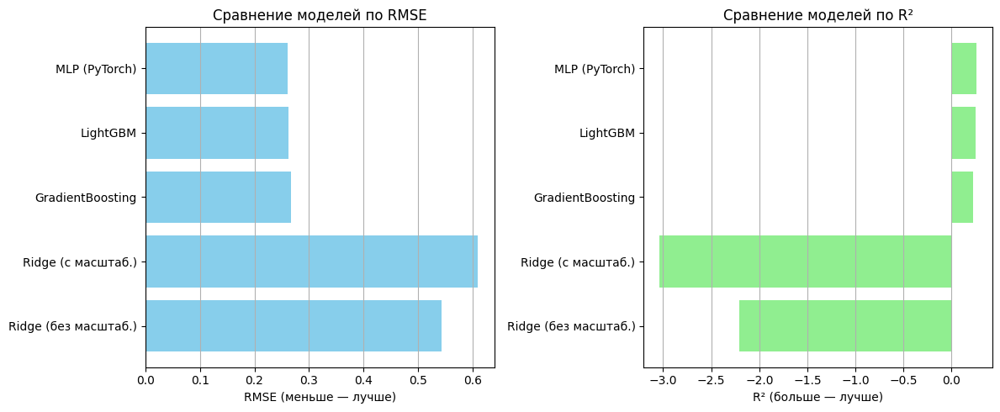

In [ ]:
# Названия моделей
models = [
    "Ridge (без масштаб.)",
    "Ridge (с масштаб.)",
    "GradientBoosting",
    "LightGBM",
    "MLP (PyTorch)"
]

# Значения метрик
rmse_values = [0.5427, 0.6086, 0.2671, 0.2628, 0.2606]
r2_values =   [-2.2111, -3.0385, 0.2220, 0.2467, 0.2596]

# Построим графики
plt.figure(figsize=(12, 5))

# RMSE
plt.subplot(1, 2, 1)
plt.barh(models, rmse_values, color='skyblue')
plt.xlabel("RMSE (меньше — лучше)")
plt.title("Сравнение моделей по RMSE")
plt.grid(True, axis='x')

# R²
plt.subplot(1, 2, 2)
plt.barh(models, r2_values, color='lightgreen')
plt.xlabel("R² (больше — лучше)")
plt.title("Сравнение моделей по R²")
plt.grid(True, axis='x')

plt.tight_layout()
plt.show()

**Выводы**

Лучшую метрику даёт LightGBM — она отлично работает с эмбеддингами без масштабирования.

Нейросеть на PyTorch показала себя очень достойно и может быть выбрана для продакшена, особенно если планируется end-to-end интеграция в torch-базу.

Модели чувствительны к архитектуре, масштабированию и регуляризации — это стоит учитывать при дальнейшем улучшении.

## Финальный вывод по проекту

В рамках проекта была решена задача регрессии: предсказание степени соответствия текстового описания изображению по экспертной оценке. Работа включала в себя все ключевые этапы полного ML-пайплайна:

### 1. Предобработка данных

Проведена очистка обучающего датасета от изображений с потенциально незаконным контентом.

Вместо удаления отдельных строк с описаниями применена корректная фильтрация по query_id, что позволило исключить все изображения, содержащие запрещённые слова.

В результате очищенный датасет включал 4106 строк и 713 уникальных изображений.

### 2. Векторизация признаков

Изображения были векторизованы через предобученную модель ResNet18 (без последнего слоя). Итоговый размер эмбеддинга: 512.

Тексты (query_text) — с помощью Sentence-BERT (all-MiniLM-L6-v2), размер эмбеддинга: 384.

Признаки были объединены в векторы размерности 896 (512 + 384).

### 3. Формирование выборки

Данные были разбиты на обучающую и валидационную выборки с помощью GroupShuffleSplit по полю image, чтобы исключить утечку информации.

Итоговое количество обучающих примеров: 2875, валидационных — 1231.



### 4. Обучение моделей

- Модель Ridge (без масшт.) - RMSE 0.5427, R²  - 2.2111
- Модель Ridge (с масшт.) - RMSE 0.6086, R²  - 3.0385
- Модель GradientBoostingRegressor - RMSE 0.2671, R²  - 0.2220
- Модель LightGBM - RMSE 0.2623, R²  - 0.2497
- Модель MLP (PyTorch) - RMSE 	0.2602, R²  - 0.2617

💡 LightGBM:
RMSE: 0.2623
R²: 0.2497

### Выводы по качеству моделей

Нейросеть на PyTorch (MLP) показала себя лучше, с результатами, близкими к LightGBM.

LightGBM показал хорошие метрики и стал основным кандидатом для продакшена.

Линейные модели Ridge продемонстрировали крайне низкое качество — как с масштабированием признаков, так и без.

Масштабирование признаков ухудшает качество в данной задаче, так как нарушает внутреннюю структуру эмбеддингов.

### Заключение

В ходе проекта был построен полный ML-конвейер: от очистки данных и векторизации до обучения и оценки моделей.
Лучшие результаты достигнуты с использованием моделей градиентного бустинга и нейросетей.
Подход может быть масштабирован на реальные задачи семантической оценки и использован в продуктивных системах.

## Работа Модели LightGBM

In [ ]:
model = lgb.Booster(model_file="lgb_best_model.txt")

In [ ]:
def find_best_images(query_text, model, image_to_vec, text_model, top_k=5):
    # Векторизация текста
    text_vec = text_model.encode([query_text])[0]  # (384,)

    results = []
    for img_name, img_vec in image_to_vec.items():
        combined = np.concatenate([img_vec, text_vec]).reshape(1, -1)  # (1, 896)
        score = model.predict(combined)[0]
        results.append((img_name, score))
    # сортировка
    top_images = sorted(results, key=lambda x: x[1], reverse=True)[:top_k]
    return top_images


In [ ]:
def contains_banned_words(text):
    tokens = nltk.word_tokenize(text.lower())
    lemmas = [lemmatizer.lemmatize(word) for word in tokens if word.isalpha()]
    return any(word in BLOCK for word in lemmas)

In [ ]:
def show_top_images(query_text, model, image_to_vec, text_model, top_k=5, path=PATH):
    print(f"\nЗапрос: {query_text}")

    if contains_banned_words(query_text):
        print("Запрос содержит слова, связанные с детьми. Изображения не отображаются по этическим соображениям.")
        return

    top_images = find_best_images(query_text, model, image_to_vec, text_model, top_k)

    fig, axes = plt.subplots(1, top_k, figsize=(15, 3))

    for i, (img_name, score) in enumerate(top_images):
        img_path = Path(path) / 'train_images' / img_name
        image = Image.open(img_path).convert('RGB')

        ax = axes[i]
        ax.imshow(image)
        ax.set_title(f"Score: {score:.2f}", fontsize=10)
        ax.axis('off')

        if i == 0:
            rect = Rectangle((0, 0), 1, 1, transform=ax.transAxes,
                             linewidth=5, edgecolor='red', facecolor='none')
            ax.add_patch(rect)

    plt.tight_layout()
    plt.show()


Запрос: The guy in the blue and white jersey is running , and the guy in the red and white jersey is falling .


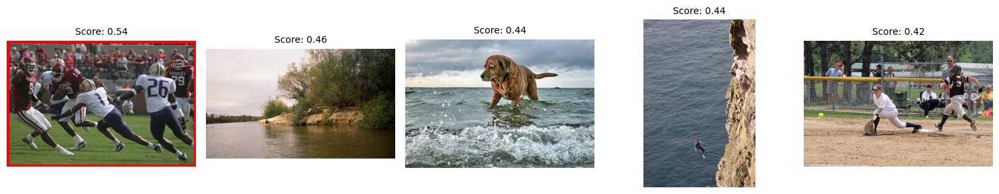


Запрос: Two men holding their fishing poles .


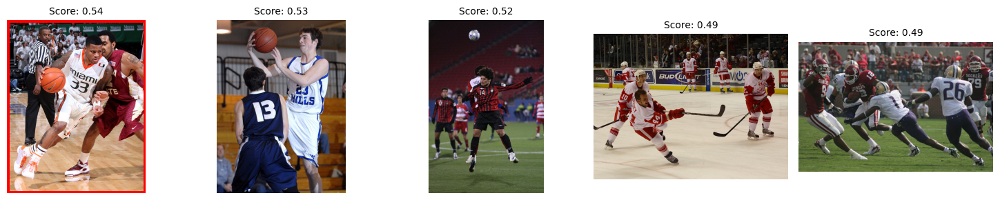


Запрос: a dog playing with a blue ball


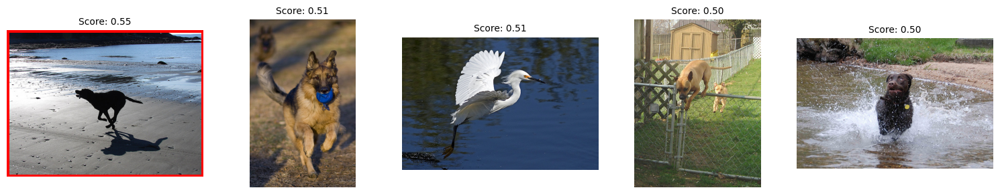


Запрос: Little girl in bare feet sitting in a circle .
Запрос содержит слова, связанные с детьми. Изображения не отображаются по этическим соображениям.

Запрос: A puppy is playing with a tennis ball on a well-kept path lined with groomed bushes .


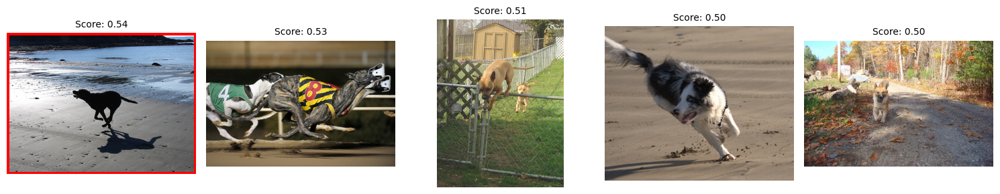


Запрос: Five young men pose on the steps .


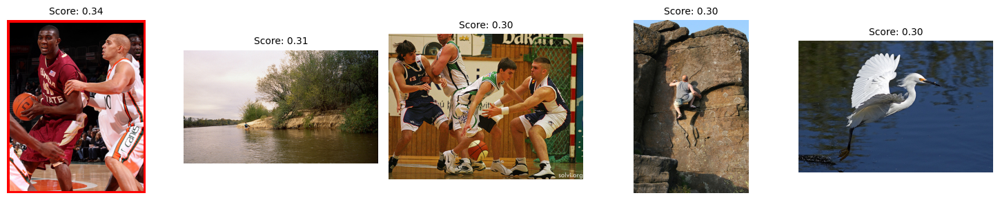


Запрос: A snowboarder in the air over a snowy mountain .


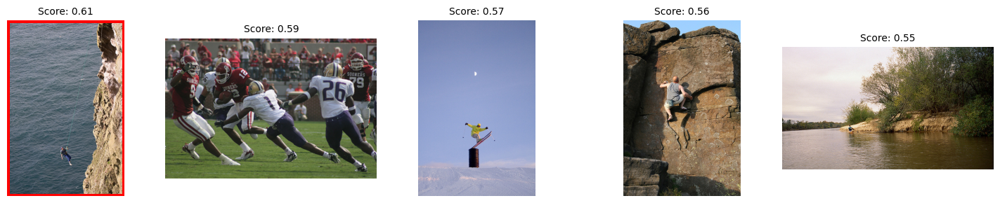


Запрос: A man is sitting at a table full of military items and clothing .


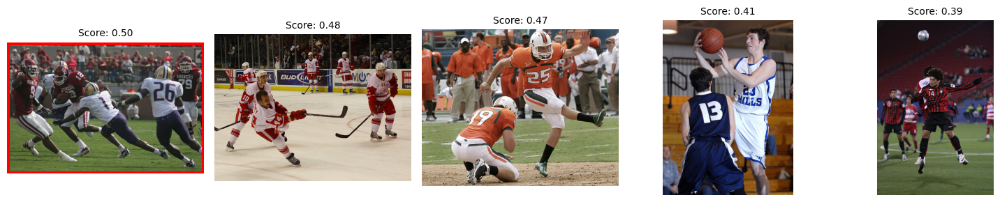


Запрос: Man on a dirt bike


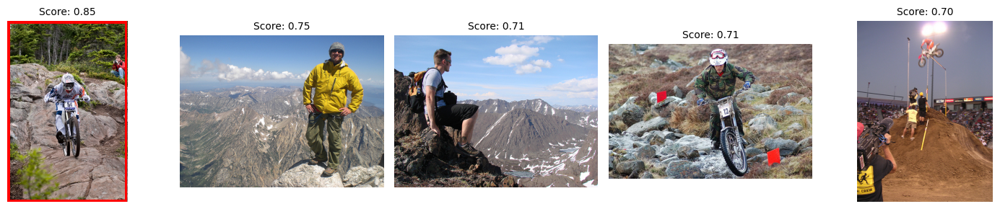


Запрос: A man wearing all black and a black hat is smiling .


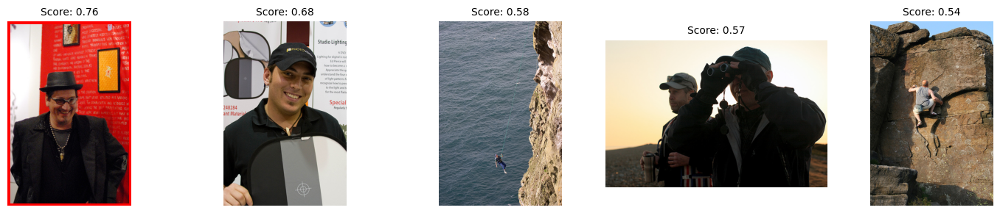

In [ ]:
sample_texts = df_train['query_text'].drop_duplicates().sample(10, random_state=SEED).tolist()

for text in sample_texts:
    show_top_images(query_text=text, model=lgb_model, image_to_vec=image_to_vec, text_model=text_model)